# M-PHATE Demonstration
## Classification (keras)

In this notebook, we demonstrate the use of M-PHATE to visualize the evolution of a simple 3-layer classifier over the course of training.

### 1. Setup

In [1]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

import keras
import scprep

import m_phate
import m_phate.train
import m_phate.data

Using TensorFlow backend.


Let's set the session so we can limit what percentage of the GPU is used, for courtesy's sake.

In [2]:
keras.backend.set_session(tf.Session(config=m_phate.train.build_config(limit_gpu_fraction=0.2)))

Now we load MNIST in preprocessed form.

In [3]:
x_train, x_test, y_train, y_test = m_phate.data.load_mnist()

### 2. Build the neural network

In [4]:
# leaky relu activation function
lrelu = keras.layers.LeakyReLU(alpha=0.1)

# input layer
inputs = keras.layers.Input(
    shape=(x_train.shape[1],), dtype='float32', name='inputs')

# three dense hidden layers
h1 = keras.layers.Dense(64, name='h1')(inputs)
h2 = keras.layers.Dense(64, name='h2')(lrelu(h1))
h3 = keras.layers.Dense(64, name='h3')(lrelu(h2))

# output layer
outputs = keras.layers.Dense(
    10, activation='softmax', name='output_all')((lrelu(h3)))

Instructions for updating:
Colocations handled automatically by placer.


Wow, that was easy.

### 3. Set up the neural network trace

Here we randomly select ten examples of every digit from the test set - the hidden activations of these images will form our data tensor to be visualized.

In [5]:
np.random.seed(42)
# select the digit indices in the test set
trace_idx = []
for i in range(10):
    trace_idx.append(np.random.choice(np.argwhere(
        y_test[:, i] == 1).flatten(), 10, replace=False))

trace_idx = np.concatenate(trace_idx)
# extract the selected images
x_trace = x_test[trace_idx]

# build a keras model which outputs the hidden activations
model_trace = keras.models.Model(inputs=inputs, outputs=[h1, h2, h3])
# use the TraceHistory helper class to store the outputs at each epoch
trace = m_phate.train.TraceHistory(x_trace, model_trace)

### 4. Train the network

In [6]:
# create another callback to store loss, accuracy etc
history = keras.callbacks.History()

# compile the model
optimizer = keras.optimizers.Adam(lr=1e-5)
model = keras.models.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer=optimizer, loss='categorical_crossentropy',
              metrics=['categorical_accuracy', 'categorical_crossentropy'])

# train!
model.fit(x_train, y_train,
          batch_size=128, epochs=200,
          verbose=0, callbacks=[trace, history],
          validation_data=(x_test,
                           y_test))

Instructions for updating:
Use tf.cast instead.


### 5. Retrieve the output

There are a lot of metadata features we might be interested in visualizing, so we show you all of them here.

The most important element here is the first: the `n_epochs x n_neurons x n_examples` tensor. We often refer to the _flattened tensor_ as this is what will be returned by M-PHATE: this is the `n_epochs*n_neurons x n_dim` matrix to be visualized.

In [7]:
# the actual data tensor
trace_data = np.array(trace.trace)
n_epochs = trace_data.shape[0]
n_neurons = trace_data.shape[1]

# the train loss for each element of the flattened trace
loss = np.repeat(history.history['categorical_crossentropy'], n_neurons)
# the validation loss for each element of the flattened trace
val_loss = np.repeat(history.history['val_categorical_crossentropy'], n_neurons)
# the train accuracy for each element of the flattened trace
accuracy = np.repeat(history.history['categorical_accuracy'], n_neurons)
# the validation accuracy for each element of the flattened trace
val_accuracy = np.repeat(history.history['val_categorical_accuracy'], n_neurons)

# the unique neuron id for each element of the flattened trace
neuron_ids = np.tile(np.arange(n_neurons), n_epochs)
# the hidden layer that each element of the flattened trace belongs to
layer_ids = np.tile(np.concatenate([np.repeat(i, int(layer.shape[1]))
                                    for i, layer in enumerate(model_trace.outputs)]),
                    n_epochs)
# the current epoch for each element of the flattened trace
epoch = np.repeat(np.arange(n_epochs), n_neurons)

# the label of each digit we selected: this should be the same as `np.repeat(np.arange(10), 10)`
digit_ids = y_test.argmax(1)[trace_idx]
# normalize the data
trace_data_norm = m_phate.utils.normalize(trace_data)
# the average activity over digit labels for each element of the flattened trace
digit_activity = np.array([np.sum(np.abs(trace_data_norm[:, :, digit_ids == digit]), axis=2)
                           for digit in np.unique(digit_ids)])
# the digit label with the highest average activity for each element of the flattened trace
most_active_digit = np.argmax(digit_activity, axis=0).flatten()

### 6. Visualize the data tensor

Calculating M-PHATE...
  Calculating multislice kernel...
  Calculated multislice kernel in 11.69 seconds.
  Calculating graph and diffusion operator...
    Calculating landmark operator...
      Calculating SVD...
      Calculated SVD in 12.39 seconds.
      Calculating KMeans...
      Calculated KMeans in 85.83 seconds.
    Calculated landmark operator in 103.62 seconds.
  Calculated graph and diffusion operator in 104.28 seconds.
  Running PHATE on precomputed affinity matrix with 38400 cells.
  Calculating optimal t...
    Automatically selected t = 35
  Calculated optimal t in 42.74 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 20.87 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 126.27 seconds.
Calculated M-PHATE in 305.90 seconds.


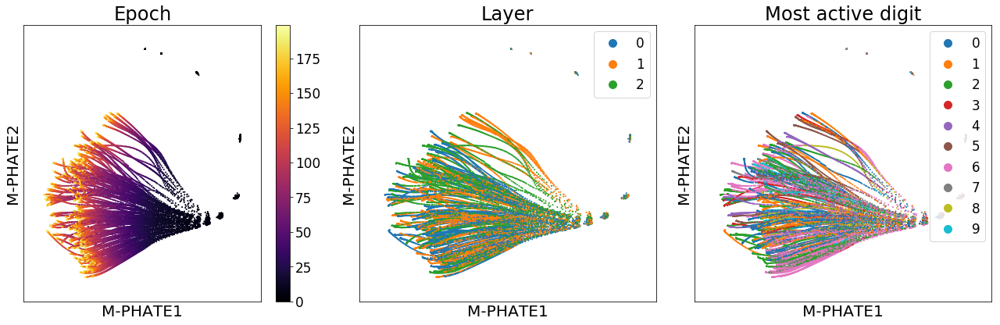

In [8]:
# calculate M-PHATE
m_phate_op = m_phate.M_PHATE()
m_phate_data = m_phate_op.fit_transform(trace_data)

# plot the results
plt.rc('font', size=14)
fig, (ax1, ax2, ax3) = plt.subplots(
    1, 3, figsize=(18, 6), sharex='all', sharey='all')
scprep.plot.scatter2d(m_phate_data, c=epoch, ax=ax1, ticks=False,
                      title='Epoch', label_prefix="M-PHATE")
scprep.plot.scatter2d(m_phate_data, c=layer_ids, ax=ax2, title='Layer',
                      ticks=False, label_prefix="M-PHATE")
scprep.plot.scatter2d(m_phate_data, c=most_active_digit, ax=ax3,
                      title='Most active digit',
                      ticks=False, label_prefix="M-PHATE")
plt.tight_layout()

Here we see the network begins with all hidden units looking approximately identical in the top right. As time progresses (see the left-hand plot) we see the hidden units develop into a heterogeneous spread. If we color these units by hidden layer (center) we see that the units are not separating by layer; that is, there are hidden units in all three layers playing similar roles. We can also color the units by their _most active digit_; that is, when averaging the activations of units across all the dimensions of the trace corresponding to each specific digit label, which of these labels has the highest average activation (in absolute value). We see some structure here in that units that are close to one another tend to have the same most active digit. If you have looked at the [autoencoder notebook](https://nbviewer.jupyter.org/github/scottgigante/m-phate/blob/master/examples/autoencoder_keras.ipynb), you'll notice that the digit structure is much clearer here - this is because the network is being forced to separate digits by class label.

Let's separate out the layers and see if there are any differences that we can't see when they are plotting all together.

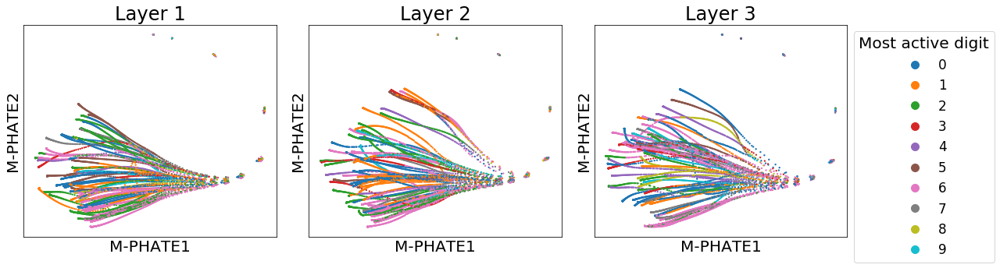

In [9]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
for layer, ax in zip(range(3), axes.flatten()):
    scprep.plot.scatter2d(m_phate_data[layer_ids==layer], c=most_active_digit[layer_ids==layer], ax=ax,
                          title="Layer {}".format(layer+1), ticks=False, label_prefix="M-PHATE", legend=layer==2,
                         legend_anchor=(1,1), legend_title="Most active digit")
plt.tight_layout()

Looks like layer 1 is substantially less heterogeneous than the following two layers. It makes sense that here, layer 1 is forming simpler features, where layers 2 and 3 are forming more complex abstract features which can be substantially more different from one another. Let's also color this plot by digit activity.

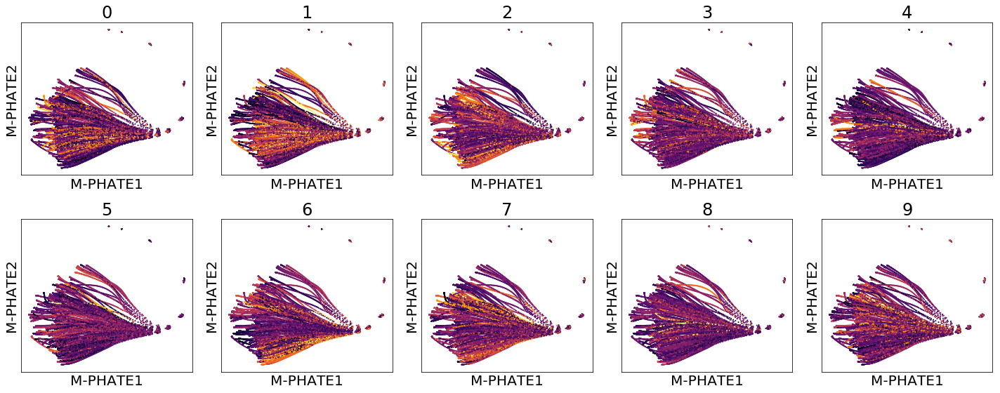

In [10]:
fig, axes = plt.subplots(2, 5, figsize=(20, 8))
for digit, ax in zip(range(10), axes.flatten()):
    scprep.plot.scatter2d(m_phate_data, c=digit_activity[digit].flatten(), ax=ax,
                          title=digit, ticks=False, label_prefix="M-PHATE", legend=False)
plt.tight_layout()

We can see bands of hidden units that seem to respond most to certain digits which broadly lines up with what we saw in the 'most active digit' plot. Namely, the group of hidden units slightly separated above the others reponds primarily to 8, while a band at the bottom of the plot responds to 0. 

Finally, we can also visualize the network loss on this plot to see how the evolution corresponds with improvements in performance.

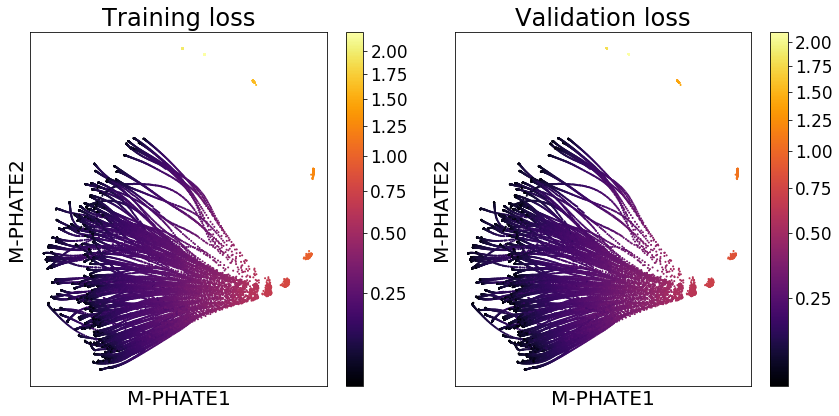

In [11]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
scprep.plot.scatter2d(m_phate_data, c=loss, ax=ax1, ticks=False, cmap_scale='sqrt',
                      title='Training loss', label_prefix="M-PHATE")
scprep.plot.scatter2d(m_phate_data, c=val_loss, ax=ax2, ticks=False, cmap_scale='sqrt',
                      title='Validation loss', label_prefix="M-PHATE")
plt.tight_layout()

### 7. Comparison to a regularized network

Just running M-PHATE on one network doesn't really tell us much. Let's build another network with the same architecture, but with dropout applied to the hidden units.

In [12]:
# keras dropout function
dropout = keras.layers.Dropout(rate=0.5)

# three dense hidden layers
h1 = keras.layers.Dense(64, name='h1')(inputs)
h2 = keras.layers.Dense(64, name='h2')(dropout(lrelu(h1)))
h3 = keras.layers.Dense(64, name='h3')(dropout(lrelu(h2)))

# output layer
outputs = keras.layers.Dense(
    10, activation='softmax', name='output_all')(dropout(lrelu(h3)))

# build a keras model which outputs the hidden activations
model_trace = keras.models.Model(inputs=inputs, outputs=[h1, h2, h3])
# use the TraceHistory helper class to store the outputs at each epoch
dropout_trace = m_phate.train.TraceHistory(x_trace, model_trace)

# create another callback to store loss, accuracy etc
history = keras.callbacks.History()

# compile the model
optimizer = keras.optimizers.Adam(lr=1e-5)
model = keras.models.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer=optimizer, loss='categorical_crossentropy',
              metrics=['categorical_accuracy', 'categorical_crossentropy'])

# train!
model.fit(x_train, y_train,
          batch_size=128, epochs=200,
          verbose=0, callbacks=[dropout_trace, history],
          validation_data=(x_test,
                           y_test))

dropout_trace_data = np.array(dropout_trace.trace)

# normalize the data
dropout_trace_data_norm = m_phate.utils.normalize(dropout_trace_data)
# the average activity over digit labels for each element of the flattened trace
dropout_digit_activity = np.array([np.sum(np.abs(dropout_trace_data_norm[:, :, digit_ids == digit]), axis=2)
                           for digit in np.unique(digit_ids)])
# the digit label with the highest average activity for each element of the flattened trace
dropout_most_active_digit = np.argmax(dropout_digit_activity, axis=0).flatten()

# calculate M-PHATE
m_phate_dropout_op = m_phate.M_PHATE()
m_phate_dropout_data = m_phate_dropout_op.fit_transform(dropout_trace_data)

Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Calculating M-PHATE...
  Calculating multislice kernel...
  Calculated multislice kernel in 11.52 seconds.
  Calculating graph and diffusion operator...
    Calculating landmark operator...
      Calculating SVD...
      Calculated SVD in 12.11 seconds.
      Calculating KMeans...
      Calculated KMeans in 86.84 seconds.
    Calculated landmark operator in 104.25 seconds.
  Calculated graph and diffusion operator in 104.87 seconds.
  Running PHATE on precomputed affinity matrix with 38400 cells.
  Calculating optimal t...
    Automatically selected t = 51
  Calculated optimal t in 46.39 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 25.78 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 299.87 seconds.
Calculated M-PHATE in 488.50 seconds.


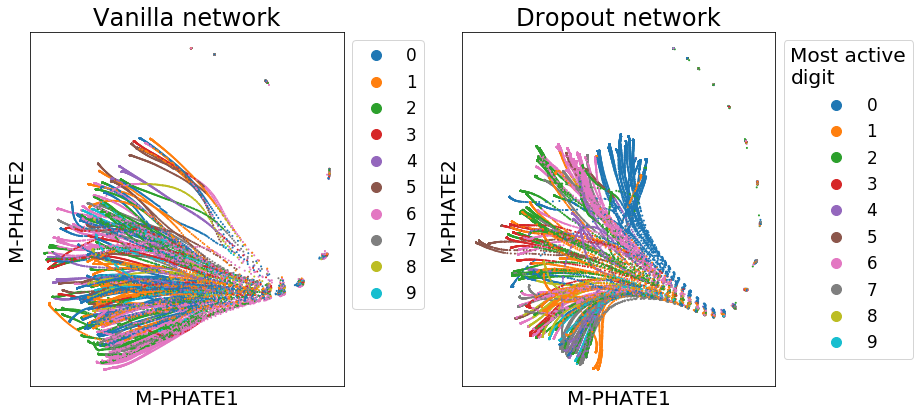

In [13]:
fig, (ax1, ax2) = plt.subplots(1,2,figsize=(13,6))
scprep.plot.scatter2d(m_phate_data, c=most_active_digit, ax=ax1,
                      title='Vanilla network',
                      ticks=False, label_prefix="M-PHATE",
                      legend_anchor=(1,1))
scprep.plot.scatter2d(m_phate_dropout_data, c=dropout_most_active_digit, ax=ax2,
                      title='Dropout network',
                      ticks=False, label_prefix="M-PHATE",
                      legend_anchor=(1,1), legend_title='Most active\ndigit')
plt.tight_layout()

Interestingly, the dropout network has spread the units out much more broadly than the vanilla network. We see this trend repeated across other types of regularizations, where a larger spread across the M-PHATE plot corresponds to higher generalization performance. For details, read our [preprint on arXiv](http://arxiv.org/abs/1908.02831).

### 8. Plot in 3D

Just for fun, we can plot M-PHATE in 3D. Sometimes you can see structure more clearly this way.

In [14]:
# do it in 3D!
m_phate_dropout_op.set_params(n_components=3)
m_phate_dropout_data = m_phate_dropout_op.transform()

Calculating metric MDS...
Calculated metric MDS in 173.82 seconds.


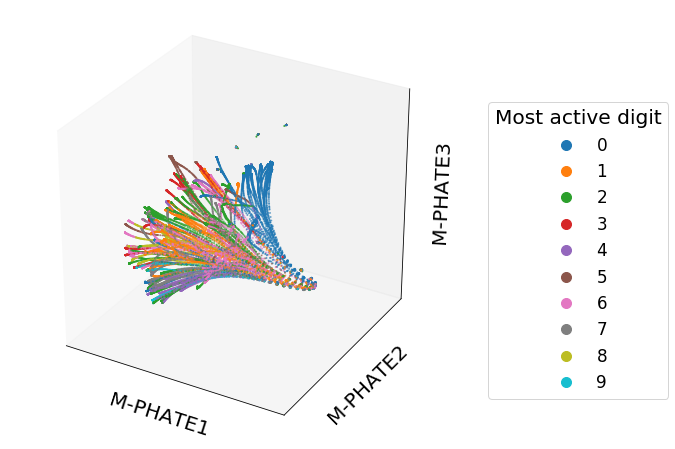

In [20]:
scprep.plot.scatter3d(m_phate_dropout_data, c=dropout_most_active_digit,
                      legend_title='Most active digit',
                      ticks=False, label_prefix="M-PHATE",
                      figsize=(8,8), legend_anchor=(1.5, 0.8))

In [22]:
# rotating plot can be saved as a gif or mp4
scprep.plot.rotate_scatter3d(m_phate_dropout_data, c=dropout_most_active_digit,
                             title='Most active digit', 
                             figsize=(8,8),
                             ticks=False, label_prefix="M-PHATE",
                             legend_anchor=(1.05, 0.8), 
                             #filename='dropout3d.gif', fps=25, rotation_speed=45
                             )